In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shapely
from libpysal import graph
from sklearn import ensemble, metrics, model_selection

In [2]:
#import notebooks

In [11]:
# Define the file paths for each GeoDataFrame
files = [
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/%german.parquet',
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/%holidayapt.parquet',
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/%rented.parquet',
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/age.parquet',
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/apartmentno.parquet',
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/buildingyear.parquet',
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/familysize.parquet',
    '/home/lisa/work/people_places_germany/Notebooks/temp_data/floorspace.parquet'
    ]

# Initialize an empty GeoDataFrame for the final combined data
combined_gdf = None

# Iterate over the files, reading only necessary columns and merging
for file in files:
    # Read 'ID', 'geometry', 'STATS', and 'cluster' columns
    gdf = gpd.read_parquet(file)

    columns = gdf.columns
    
    # Generate names for 'STATS' and 'cluster' columns to avoid conflicts
    base_name = file.split('/')[-1].replace('.parquet', '')
    stat_col_name = base_name
    
    # Rename the columns
    gdf.rename(columns={'STATS': stat_col_name, 'STATS_lag': stat_col_name+'_lag'}, inplace=True)
    
    # Merge with the combined GeoDataFrame
    if combined_gdf is None:
        combined_gdf = gdf
    else:
        combined_gdf = combined_gdf.merge(gdf, on=['ID', 'geometry', 'cluster'])

# Now 'combined_gdf' contains all 'STATS' columns from the different GeoDataFrames


In [70]:
combined_gdf.to_parquet('/data/processed_data/regression_stats')

In [2]:
combined_gdf = gpd.read_parquet('/data/processed_data/regression_stats')

In [54]:
combined_gdf = combined_gdf.drop('cluster',axis=1)

In [4]:
clusters = gpd.read_parquet('/data/cluster_data/clusters_umap_freiburg_100_3_gaussian_euclidean_complete_chebyshev_3.pq')

In [8]:
clusters

,label,geometry
0,1,"MULTIPOLYGON (((4161502.134 2761974.212, 41614..."
1,2,"MULTIPOLYGON (((4155094.41 2764528.229, 415507..."
2,3,"MULTIPOLYGON (((4159546.337 2766842.824, 41594..."
3,4,"POLYGON ((4159865.87 2765092.538, 4159835.928 ..."
4,5,"MULTIPOLYGON (((4156400.083 2765076.095, 41563..."
5,6,"MULTIPOLYGON (((4156146.283 2767165.241, 41561..."
6,7,"MULTIPOLYGON (((4156876.121 2766204.542, 41568..."
7,8,"MULTIPOLYGON (((4155950.213 2765153.646, 41559..."
8,9,"MULTIPOLYGON (((4155591.528 2767280.149, 41555..."
9,10,"MULTIPOLYGON (((4156126.921 2764752.106, 41561..."


In [6]:
morphotopes = gpd.read_parquet('/data/cluster_data/morphotopes_freiburg_100_3_gaussian.pq').reset_index()

In [7]:
morphotopes

,index,label,geometry,morph_label
0,0,0_1.0,"POLYGON ((4162622.337 2757915.232, 4162616.364...",0
1,1,10_1.0,"POLYGON ((4156658.273 2764245.417, 4156644.126...",1
2,2,11_1.0,"POLYGON ((4160704.542 2763120.268, 4160719.303...",2
3,3,12_1.0,"POLYGON ((4161466.256 2762088.504, 4161470.945...",3
4,4,13_1.0,"POLYGON ((4161456.543 2762163.225, 4161455.52 ...",4
...,...,...,...,...
207,207,5_1.0,"MULTIPOLYGON (((4160220.096 2764698.39, 416023...",207
208,208,6_1.0,"POLYGON ((4157106.219 2767977.804, 4157091.643...",208
209,209,7_1.0,"POLYGON ((4155399.573 2764674.046, 4155372.305...",209
210,210,8_1.0,"POLYGON ((4155113.611 2764516.483, 4155102.012...",210


In [31]:
morph_data = pd.read_parquet('/home/lisa/work/people_places_germany/Notebooks/temp_data/morphotopes_data_freiburg_100_3__median_gaussian.pq').reset_index()

In [32]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import adjusted_rand_score
clusters = KMeans(n_clusters=7, max_iter=5000, n_init=300).fit(morph_data).labels_
np.unique(clusters)

array([0, 1, 2, 3, 4, 5, 6], dtype=int32)

In [33]:
morph_data

index        sdbAre                                sdbPer            \
            percentile_10    median percentile_90 percentile_10    median   
0     0_1.0      1.311327  0.354031     -0.478671      1.552820  0.284395   
1    10_1.0     -0.185329 -0.979789     -0.773022     -0.230043 -1.400044   
2    11_1.0     -0.394088 -1.165836     -0.814079     -0.817960 -1.955504   
3    12_1.0      0.851126 -0.056100     -0.569180      1.164566 -0.082426   
4    13_1.0      1.037155  0.109688     -0.532593      1.834172  0.550214   
..      ...           ...       ...           ...           ...       ...   
225   5_1.0      0.337265  0.047334     -0.422465      0.677775  0.280105   
226   6_1.0     -0.279542 -1.006254     -0.597409     -0.400347 -1.431716   
227   7_1.0     -0.260726  0.433622      0.419700     -0.388778  0.328858   
228   8_1.0      0.156365 -0.560730     -0.485830      0.388829 -0.304092   
229   9_1.0     -0.306847 -0.309447      4.756527     -0.513507 -0.296197   

                         ssbCCo                          ...        ltkWNB  \
    percentile_90 percentile_10    median percentile_90  ... percentile_90   
0       -0.656528      2.181181  0.954965     -0.403379  ...     -1.042032   
1       -1.288321      2.171851  0.941047     -0.417073  ...     -1.319753   
2       -1.496661      2.542529  1.493983      0.126939  ...     -1.315388   
3       -0.794114      2.778117  1.845407      0.472690  ...     -0.590794   
4       -0.556826     -0.365828 -2.844376     -4.141401  ...     -1.046024   
..            ...           ...       ...           ...  ...           ...   
225     -0.349657      0.096630 -1.536973     -2.247505  ...      0.059508   
226     -0.888578      0.200862 -0.492583      0.124194  ...     -1.352630   
227      0.867976     -1.638323 -0.308141     -0.053457  ...     -1.279980   
228     -0.633052     -1.607808 -0.467387      0.018141  ...     -1.378947   
229      5.351685     -2.313144 -0.482803     -0.087239  ...     -1.333680   

           likWBB                                sdsAre            \
    percentile_10    median percentile_90 percentile_10    median   
0       -1.668643 -1.797492     -1.852091      1.575012  1.243977   
1       -1.730906 -1.849982     -1.896489      1.262440  0.962621   
2       -1.737397 -1.855455     -1.901118      0.692147  0.449279   
3       -1.664482 -1.793983     -1.849123      0.130569 -0.056217   
4       -1.687489 -1.813379     -1.865529      1.268794  0.968340   
..            ...       ...           ...           ...       ...   
225     -1.649195 -1.762538     -1.806830      1.466523  1.146323   
226     -1.625370 -1.761009     -1.821233      0.001679 -0.144303   
227     -1.398439 -1.441658     -1.551118      2.862872  2.403227   
228     -1.645784 -1.778220     -1.835790      2.862872  2.403227   
229      0.210205 -0.213499     -0.512311      1.053320  0.774384   

                         likWCe                          
    percentile_90 percentile_10    median percentile_90  
0        0.901497     -1.246074 -1.424208     -1.585283  
1        0.646014     -1.256755 -1.432549     -1.591989  
2        0.179880     -1.255499 -1.431568     -1.591200  
3       -0.279130     -1.224678 -1.407499     -1.571851  
4        0.651207     -1.252619 -1.429319     -1.589391  
..            ...           ...       ...           ...  
225      0.812823     -1.208691 -1.368244     -1.518774  
226     -0.359115     -1.050804 -1.271714     -1.462695  
227      1.954140     -1.146357 -1.315434     -1.497841  
228      1.954140     -1.185194 -1.376664     -1.547063  
229      0.475088     -1.045437 -1.267523     -1.459326  

[230 rows x 187 columns]

In [35]:
morph_data['cluster','cluster']=clusters

In [38]:
morph_merge = morph_data[['index','cluster']]
morph_merge.columns = morph_merge.columns.get_level_values(0)

In [40]:
morphotopes

,index,label,geometry,morph_label
0,0,0_1.0,"POLYGON ((4162622.337 2757915.232, 4162616.364...",0
1,1,10_1.0,"POLYGON ((4156658.273 2764245.417, 4156644.126...",1
2,2,11_1.0,"POLYGON ((4160704.542 2763120.268, 4160719.303...",2
3,3,12_1.0,"POLYGON ((4161466.256 2762088.504, 4161470.945...",3
4,4,13_1.0,"POLYGON ((4161456.543 2762163.225, 4161455.52 ...",4
...,...,...,...,...
207,207,5_1.0,"MULTIPOLYGON (((4160220.096 2764698.39, 416023...",207
208,208,6_1.0,"POLYGON ((4157106.219 2767977.804, 4157091.643...",208
209,209,7_1.0,"POLYGON ((4155399.573 2764674.046, 4155372.305...",209
210,210,8_1.0,"POLYGON ((4155113.611 2764516.483, 4155102.012...",210


In [43]:
morph_merge['label'] = morph_merge['index']

/tmp/ipykernel_33709/2244979932.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  morph_merge['label'] = morph_merge['index']


In [46]:
morphotopes = morphotopes.merge(morph_merge, how = 'left', on = 'label')

In [55]:
overlap = gpd.overlay(combined_gdf, morphotopes, how='intersection')

In [61]:
overlap

,ID,%german,Germany,Abroad,%german_lag,Germany_lag,Abroad_lag,%holidayapt,%rented,Rented: with currently managed household,...,170 - 179_lag,morph_label_1,label_1,index_x,label_2,morph_label_2,index_y,cluster,geometry,area
0,100mN27618E41614,1.000000,12.0,NaN,0.750000,3.000000,NaN,0.0,0.000000,NaN,...,NaN,3,1,3,12_1.0,3,12_1.0,5.0,"POLYGON ((4161446.55 2761900, 4161441.57 27618...",479.886785
1,100mN27625E41613,0.920000,69.0,6.0,0.935507,25.333333,NaN,0.0,0.488372,21.0,...,NaN,206,14,206,4_5,206,4_5,2.0,"POLYGON ((4161400 2762578.155, 4161400 2762500...",10000.000000
2,100mN27626E41613,0.850000,51.0,9.0,0.960000,36.000000,NaN,0.0,0.918919,34.0,...,NaN,206,14,206,4_5,206,4_5,2.0,"POLYGON ((4161400 2762600, 4161393.774 2762600...",10000.000000
3,100mN27628E41614,0.947368,18.0,NaN,0.943333,7.400000,NaN,0.0,0.428571,3.0,...,NaN,201,13,201,4_0,201,4_0,2.0,"POLYGON ((4161500 2762821.939, 4161489.126 276...",8670.020220
4,100mN27628E41614,0.947368,18.0,NaN,0.943333,7.400000,NaN,0.0,0.428571,3.0,...,NaN,201,13,206,4_5,206,4_5,2.0,"MULTIPOLYGON (((4161434.659 2762800, 4161438.0...",479.465259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4092,100mN27710E41619,1.000000,10.0,NaN,0.985915,70.000000,NaN,0.0,0.000000,NaN,...,NaN,39,10,39,3_110,39,3_110,4.0,"POLYGON ((4161900 2771000, 4161900 2771096.007...",8872.841662
4093,100mN27710E41619,1.000000,10.0,NaN,0.985915,70.000000,NaN,0.0,0.000000,NaN,...,NaN,39,10,109,3_174,109,3_174,0.0,"POLYGON ((4162000 2771000, 4161981.66 2771000,...",1115.367469
4094,100mN27710E41621,1.000000,24.0,NaN,0.952554,80.500000,NaN,0.0,0.272727,3.0,...,NaN,109,10,109,3_174,109,3_174,0.0,"POLYGON ((4162100 2771000, 4162100 2771018.996...",469.251945
4095,100mN27711E41603,0.909091,10.0,NaN,0.937500,5.000000,NaN,0.0,1.000000,6.0,...,NaN,49,16,49,3_12,49,3_12,1.0,"POLYGON ((4160400 2771100, 4160300 2771100, 41...",10000.000000


In [59]:
# Calculate the area of overlap
overlap['area'] = overlap.geometry.area

# Find the cluster with the largest overlap for each cell
largest_overlap = overlap.loc[overlap.groupby(overlap['ID'])['area'].idxmax()]

In [62]:
combined_gdf = combined_gdf.merge(largest_overlap[['ID', 'cluster']], on='ID')

In [66]:
combined_gdf

,ID,geometry,%german,Germany,Abroad,%german_lag,Germany_lag,Abroad_lag,%holidayapt,%rented,...,120 - 129_lag,100 - 109_lag,140 - 149_lag,150 - 159_lag,130 - 139_lag,160 - 169_lag,170 - 179_lag,morph_label,label,cluster
0,100mN27618E41614,"POLYGON ((4161500 2761900, 4161500 2761800, 41...",1.000000,12.0,NaN,0.750000,3.000000,NaN,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,1,5.0
1,100mN27625E41613,"POLYGON ((4161400 2762600, 4161400 2762500, 41...",0.920000,69.0,6.0,0.935507,25.333333,NaN,0.0,0.488372,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206,14,2.0
2,100mN27626E41613,"POLYGON ((4161400 2762700, 4161400 2762600, 41...",0.850000,51.0,9.0,0.960000,36.000000,NaN,0.0,0.918919,...,NaN,5.0,NaN,NaN,NaN,NaN,NaN,206,14,2.0
3,100mN27628E41614,"POLYGON ((4161500 2762900, 4161500 2762800, 41...",0.947368,18.0,NaN,0.943333,7.400000,NaN,0.0,0.428571,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,201,13,2.0
4,100mN27628E41615,"POLYGON ((4161600 2762900, 4161600 2762800, 41...",1.000000,3.0,NaN,0.915789,12.666667,NaN,0.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,201,13,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2114,100mN27710E41605,"POLYGON ((4160600 2771100, 4160600 2771000, 41...",0.529412,9.0,8.0,0.800000,NaN,NaN,0.0,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49,16,1.0
2115,100mN27710E41619,"POLYGON ((4162000 2771100, 4162000 2771000, 41...",1.000000,10.0,NaN,0.985915,70.000000,NaN,0.0,0.000000,...,3.0,6.0,NaN,NaN,NaN,NaN,NaN,39,10,4.0
2116,100mN27710E41621,"POLYGON ((4162200 2771100, 4162200 2771000, 41...",1.000000,24.0,NaN,0.952554,80.500000,NaN,0.0,0.272727,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109,10,0.0
2117,100mN27711E41603,"POLYGON ((4160400 2771200, 4160400 2771100, 41...",0.909091,10.0,NaN,0.937500,5.000000,NaN,0.0,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49,16,1.0


In [68]:
combined_gdf.explore(column='cluster',cmap='tab20')

In [69]:
combined_gdf['label'] = combined_gdf['cluster']

In [70]:
# Assuming gdf is your GeoDataFrame
nan_percentage = combined_gdf.isna().mean() * 100

# Display the percentage of NaN values for each column
print(nan_percentage)

ID                 0.000000
geometry           0.000000
%german            0.000000
Germany            0.000000
Abroad            21.047664
                    ...    
160 - 169_lag    100.000000
170 - 179_lag    100.000000
morph_label        0.000000
label              0.141576
cluster            0.141576
Length: 128, dtype: float64


In [71]:
combined_gdf.columns

Index(['ID', 'geometry', '%german', 'Germany', 'Abroad', '%german_lag',
       'Germany_lag', 'Abroad_lag', '%holidayapt', '%rented',
       ...
       '120 - 129_lag', '100 - 109_lag', '140 - 149_lag', '150 - 159_lag',
       '130 - 139_lag', '160 - 169_lag', '170 - 179_lag', 'morph_label',
       'label', 'cluster'],
      dtype='object', length=128)

# random forest

In [78]:
combined_gdf = combined_gdf[combined_gdf.cluster.notna()]

In [79]:
training_sample = combined_gdf.sample(2000, random_state=0)

In [80]:
independent_variables = [
    "%german",
    "%rented",
    "age",
    "apartmentno",
    "buildingyear",
    "familysize",
    "floorspace",
    "%german_lag",
    "%rented_lag",
    "age_lag",
    "apartmentno_lag",
    "buildingyear_lag",
    "familysize_lag",
    "floorspace_lag"
]

In [81]:
independent = training_sample[independent_variables]
independent

,%german,%rented,age,apartmentno,buildingyear,familysize,floorspace,%german_lag,%rented_lag,age_lag,apartmentno_lag,buildingyear_lag,familysize_lag,floorspace_lag
1290,0.926829,0.785714,36.463415,3.428571,1900.000000,3.666667,125.150000,0.796443,NaN,NaN,8.133333,1959.363095,2.340901,NaN
1621,0.922222,0.522727,42.582418,1.843750,1984.944444,2.720000,96.553191,0.873917,0.641503,43.327966,5.817803,1975.495370,2.414171,72.813909
1609,1.000000,0.428571,68.750000,NaN,NaN,2.000000,NaN,0.937901,0.310820,39.583432,NaN,NaN,2.441429,NaN
897,0.903226,0.500000,40.384615,4.500000,1978.333333,2.333333,83.388889,0.869622,0.763434,41.137499,3.124026,1971.480128,2.530288,76.889404
2095,0.944751,0.293578,53.674033,1.000000,1964.000000,2.301587,80.176190,0.825087,0.280079,NaN,1.058333,1964.000000,2.453860,113.915150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444,1.000000,0.166667,43.750000,1.230769,1934.000000,2.750000,139.600000,0.952263,0.488161,43.623089,2.564899,1956.845960,2.486048,91.208081
1208,0.672297,0.800000,39.831081,1.000000,1986.285714,2.917647,72.326087,0.793226,0.625734,37.472761,5.650000,NaN,2.963020,80.396860
1395,0.949153,0.666667,40.762712,2.833333,1945.250000,2.272727,87.211538,0.900375,0.489000,45.832389,NaN,NaN,2.600616,NaN
2050,0.952381,0.727273,37.631579,3.250000,1998.000000,3.000000,44.500000,0.933154,0.345470,40.509327,1.608182,NaN,NaN,128.515604


In [82]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(independent, training_sample["label"], test_size=0.25, random_state=0)

In [83]:
model = ensemble.RandomForestClassifier(random_state=0, n_jobs=-1)
model.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=0)

In [84]:
pred = model.predict(X_test)
pred

array([6., 6., 1., 6., 6., 6., 4., 6., 4., 4., 4., 4., 1., 4., 4., 1., 4.,
       4., 6., 6., 1., 4., 6., 6., 4., 4., 6., 3., 0., 4., 6., 1., 4., 4.,
       1., 4., 3., 6., 4., 6., 6., 1., 6., 1., 1., 6., 4., 6., 6., 6., 6.,
       6., 6., 4., 4., 6., 1., 1., 0., 6., 6., 1., 4., 4., 1., 1., 4., 6.,
       2., 4., 2., 4., 6., 4., 1., 4., 4., 4., 4., 6., 1., 1., 0., 1., 4.,
       4., 4., 4., 6., 1., 6., 6., 4., 1., 4., 1., 4., 6., 6., 4., 4., 6.,
       1., 4., 6., 4., 1., 2., 1., 4., 1., 6., 6., 4., 4., 4., 1., 1., 1.,
       1., 1., 6., 0., 6., 1., 4., 4., 4., 1., 4., 2., 1., 4., 4., 1., 0.,
       4., 6., 1., 4., 4., 6., 4., 6., 4., 4., 4., 4., 4., 1., 6., 4., 1.,
       6., 1., 6., 6., 1., 1., 1., 4., 1., 6., 6., 4., 1., 1., 4., 4., 6.,
       4., 6., 1., 6., 6., 4., 6., 1., 4., 4., 6., 4., 1., 1., 6., 4., 4.,
       4., 4., 4., 4., 1., 4., 6., 1., 6., 4., 6., 4., 4., 4., 6., 1., 4.,
       6., 6., 4., 1., 4., 6., 4., 4., 4., 1., 4., 1., 1., 4., 4., 6., 6.,
       1., 4., 1., 1., 1.

In [85]:
y_test

1303    6.0
729     6.0
1892    6.0
1070    4.0
281     1.0
       ... 
1124    0.0
815     4.0
1948    4.0
380     6.0
404     1.0
Name: label, Length: 500, dtype: float64

In [86]:
proba = model.predict_proba(X_test)
proba

array([[0.09, 0.28, 0.07, ..., 0.19, 0.  , 0.31],
       [0.07, 0.07, 0.  , ..., 0.35, 0.  , 0.51],
       [0.  , 0.49, 0.12, ..., 0.09, 0.  , 0.28],
       ...,
       [0.08, 0.13, 0.13, ..., 0.45, 0.  , 0.18],
       [0.01, 0.3 , 0.01, ..., 0.09, 0.  , 0.58],
       [0.11, 0.14, 0.09, ..., 0.31, 0.  , 0.35]])

In [87]:
model.classes_

array([0., 1., 2., 3., 4., 5., 6.])

In [88]:
pd.DataFrame(proba, columns=model.classes_, index=X_test.index)

,0.0,1.0,2.0,3.0,4.0,5.0,6.0
1303,0.09,0.28,0.07,0.06,0.19,0.0,0.31
729,0.07,0.07,0.00,0.00,0.35,0.0,0.51
1892,0.00,0.49,0.12,0.02,0.09,0.0,0.28
1070,0.06,0.13,0.07,0.10,0.25,0.0,0.39
281,0.06,0.31,0.12,0.01,0.11,0.0,0.39
...,...,...,...,...,...,...,...
1124,0.31,0.00,0.27,0.00,0.33,0.0,0.09
815,0.09,0.22,0.02,0.04,0.41,0.0,0.22
1948,0.08,0.13,0.13,0.03,0.45,0.0,0.18
380,0.01,0.30,0.01,0.01,0.09,0.0,0.58


In [89]:
accuracy = metrics.accuracy_score(pred, y_test)
kappa = metrics.cohen_kappa_score(pred, y_test)

summary = f"""\
Evaluation metrics
==================
Basic model:
  Accuracy: {round(accuracy, 3)}
  Kappa:    {round(kappa, 3)}
"""

print(summary)

Evaluation metrics
Basic model:
  Accuracy: 0.506
  Kappa:    0.325



In [90]:
pd.Series(model.feature_importances_, index=model.feature_names_in_).sort_values()

%german             0.055453
familysize          0.056500
%rented             0.056643
age                 0.064350
floorspace          0.066161
apartmentno         0.067712
floorspace_lag      0.069157
%german_lag         0.069378
buildingyear        0.070266
buildingyear_lag    0.080831
age_lag             0.081896
%rented_lag         0.084346
familysize_lag      0.086009
apartmentno_lag     0.091298
dtype: float64

/opt/conda/lib/python3.11/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(


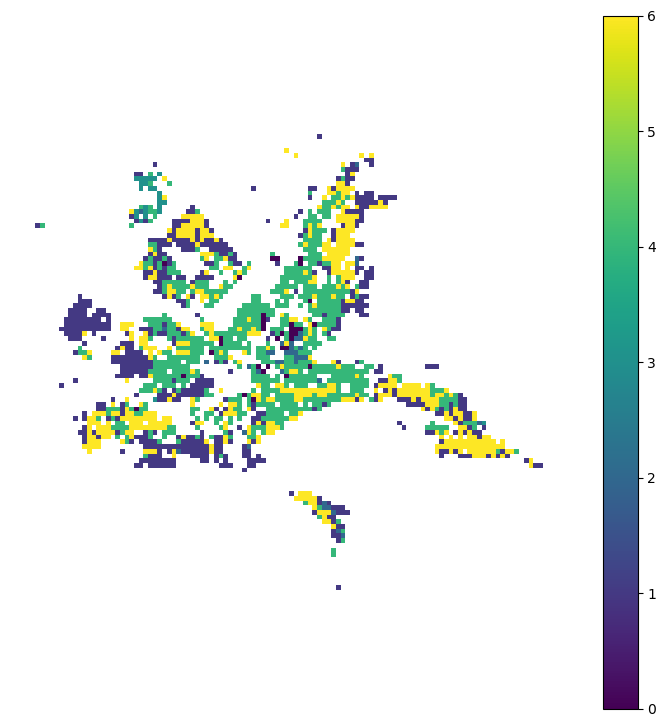

In [91]:
predicted = model_selection.cross_val_predict(
    model, independent, training_sample["label"], cv=4, n_jobs=-1
)

ax = training_sample.plot(predicted, legend=True, figsize=(9, 9), markersize=0.1)
ax.set_axis_off()

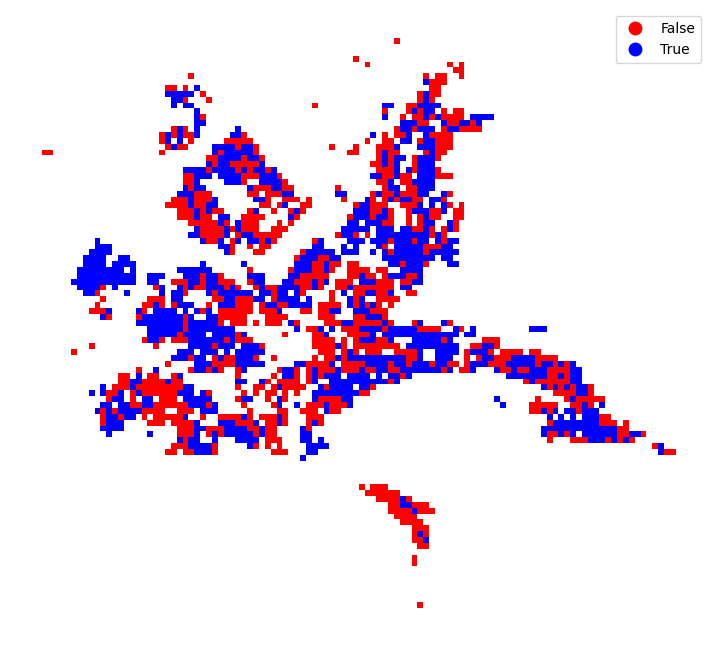

In [92]:
ax = training_sample.plot(
    predicted == training_sample["label"],
    categorical=True,
    figsize=(9, 9),
    markersize=0.1,
    cmap="bwr_r",
    legend=True,
)
ax.set_axis_off()

In [93]:
gkf = model_selection.StratifiedGroupKFold(n_splits=5)
splits = gkf.split(
    training_sample,
    training_sample.label,
    groups=training_sample.morph_label,
)

In [94]:
gkf

StratifiedGroupKFold(n_splits=5, random_state=None, shuffle=False)

In [95]:
split_label = np.empty(len(training_sample), dtype=float)
for i, (train, test) in enumerate(splits):
    split_label[test] = i
training_sample["split"] = split_label


/opt/conda/lib/python3.11/site-packages/sklearn/model_selection/_split.py:994: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


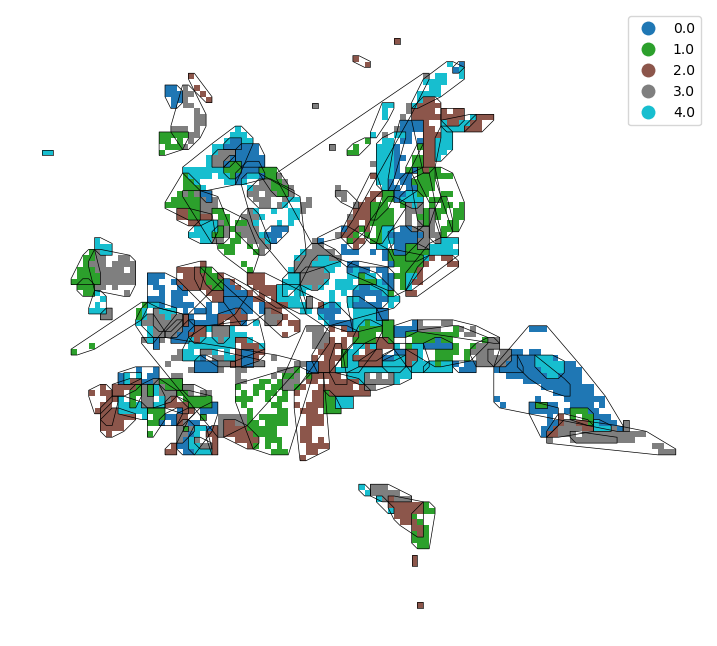

In [96]:
ax = training_sample.plot(
  "split", categorical=True, figsize=(9, 9), markersize=0.1, legend=True
)
training_sample.dissolve("morph_label").convex_hull.boundary.plot(
    ax=ax, color="k", linewidth=0.5, markersize=0
)
ax.set_axis_off()

In [97]:
train = training_sample["split"] != 0
X_train = independent.loc[train]
y_train = training_sample["label"].loc[train]

test = training_sample["split"] == 0
X_test = independent.loc[test]
y_test = training_sample["label"].loc[test]

In [98]:
rf_spatial_cv = ensemble.RandomForestClassifier(random_state=0, n_jobs=-1)
rf_spatial_cv.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=0)

In [99]:
pred = rf_spatial_cv.predict(X_test)

accuracy_spatial_cv = metrics.accuracy_score(pred, y_test)
kappa_spatial_cv = metrics.cohen_kappa_score(pred, y_test)

summary += f"""\
Basic model with spatial cross-validation:
  Accuracy: {round(accuracy_spatial_cv, 3)}
  Kappa:    {round(kappa_spatial_cv, 3)}
"""

print(summary)

Evaluation metrics
Basic model:
  Accuracy: 0.506
  Kappa:    0.325
Basic model with spatial cross-validation:
  Accuracy: 0.429
  Kappa:    0.22



In [106]:
import shap

In [107]:
# Create Tree Explainer object that can calculate shap values
explainer = shap.TreeExplainer(rf_spatial_cv)

In [112]:
shap_values = explainer.shap_values(X_test)

In [117]:
X_test

,%german,%rented,age,apartmentno,buildingyear,familysize,floorspace,%german_lag,%rented_lag,age_lag,apartmentno_lag,buildingyear_lag,familysize_lag,floorspace_lag
897,0.903226,0.500000,40.384615,4.500000,1978.333333,2.333333,83.388889,0.869622,0.763434,41.137499,3.124026,1971.480128,2.530288,76.889404
2095,0.944751,0.293578,53.674033,1.000000,1964.000000,2.301587,80.176190,0.825087,0.280079,NaN,1.058333,1964.000000,2.453860,113.915150
801,0.969697,0.437500,42.096774,3.000000,1951.142857,2.375000,68.500000,0.925629,0.601002,42.904774,2.441538,1954.184615,NaN,93.619577
526,1.000000,0.416667,41.666667,1.333333,1964.000000,2.000000,182.250000,0.911343,0.401083,42.760029,NaN,1964.000000,3.103377,109.232436
399,0.741935,0.525000,34.680851,4.500000,1964.000000,2.000000,88.617647,0.908955,0.865841,NaN,4.755602,1968.500000,2.249449,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
637,1.000000,0.700000,36.818182,1.000000,1964.000000,2.000000,99.500000,0.826233,0.817180,35.705663,8.003247,1977.920635,2.761998,73.022354
1304,0.860656,0.946429,40.327869,9.500000,1964.000000,2.937500,75.409091,0.836565,0.614159,41.634159,8.475000,1973.750000,2.988305,81.585551
488,0.916667,0.465517,37.474227,7.000000,1993.000000,2.650000,93.887755,0.917284,0.630198,43.008470,3.242708,1968.229708,2.549822,85.996582
444,1.000000,0.166667,43.750000,1.230769,1934.000000,2.750000,139.600000,0.952263,0.488161,43.623089,2.564899,1956.845960,2.486048,91.208081


In [121]:
rf_spatial_cv.classes_

array([0., 1., 2., 3., 4., 5., 6.])

SHAP summary plot for class: 0.0


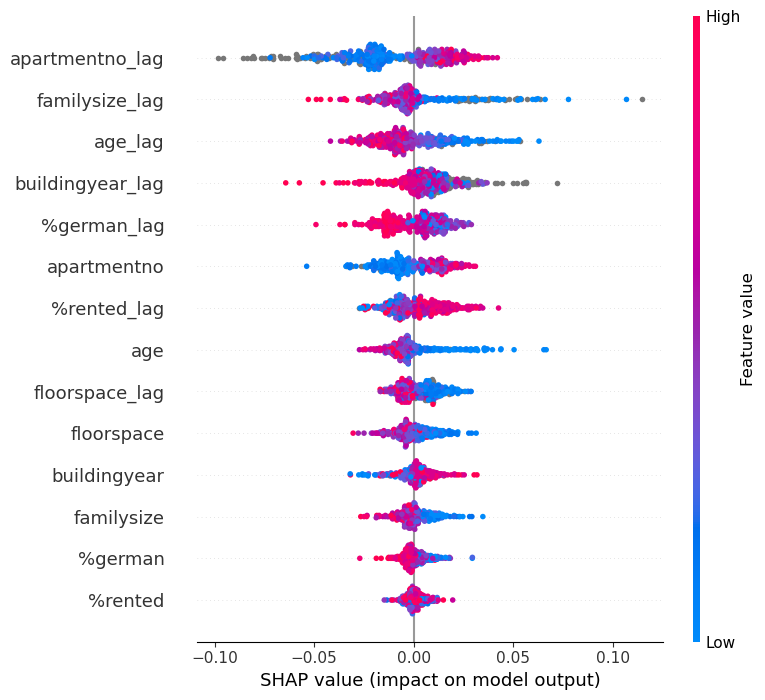

SHAP summary plot for class: 1.0


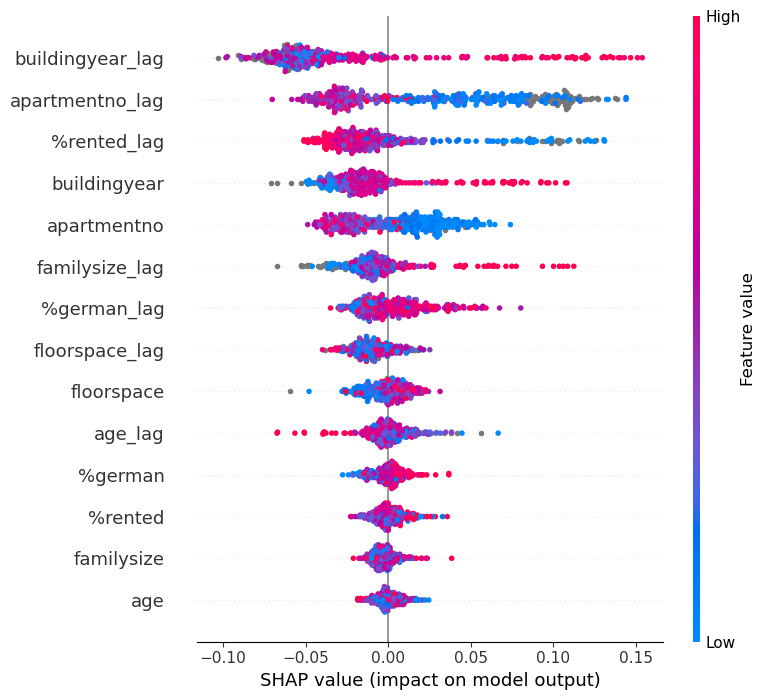

SHAP summary plot for class: 2.0


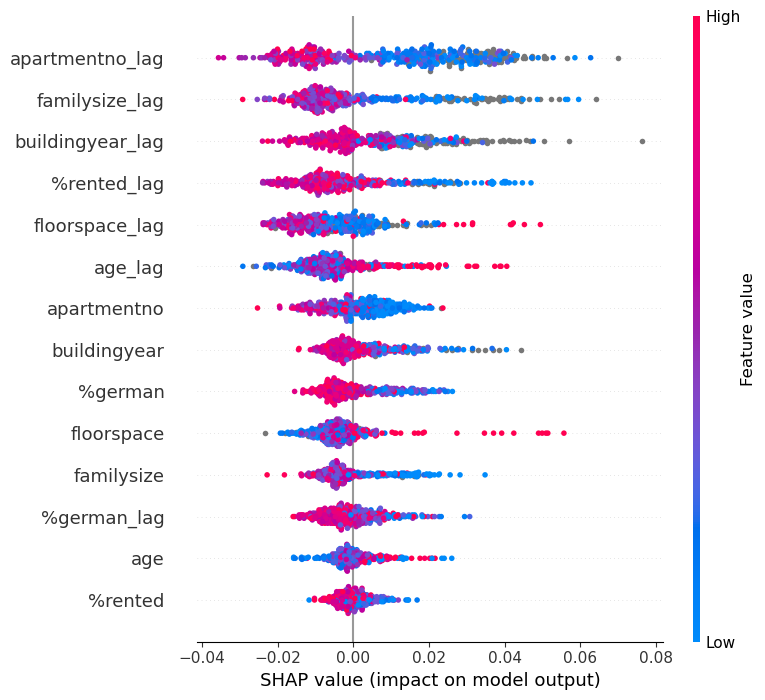

SHAP summary plot for class: 3.0


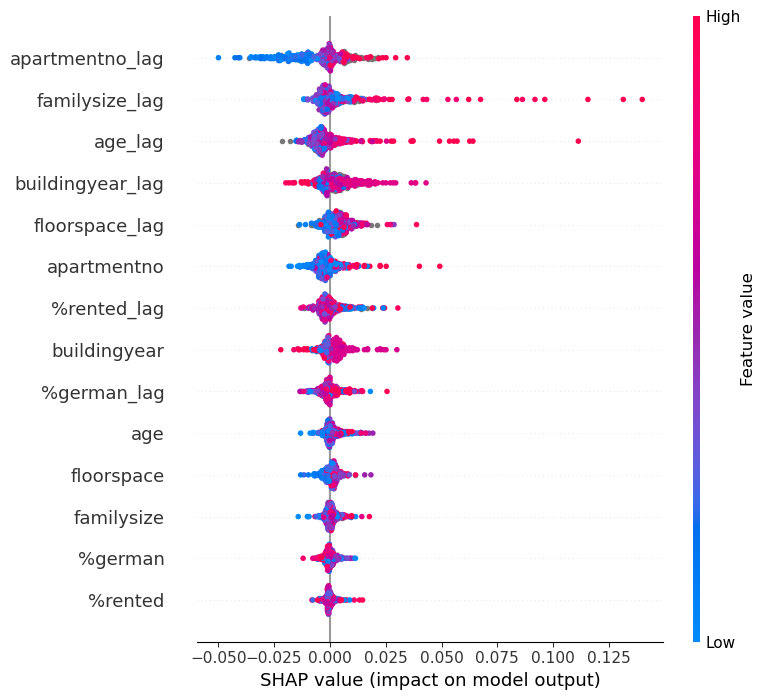

SHAP summary plot for class: 4.0


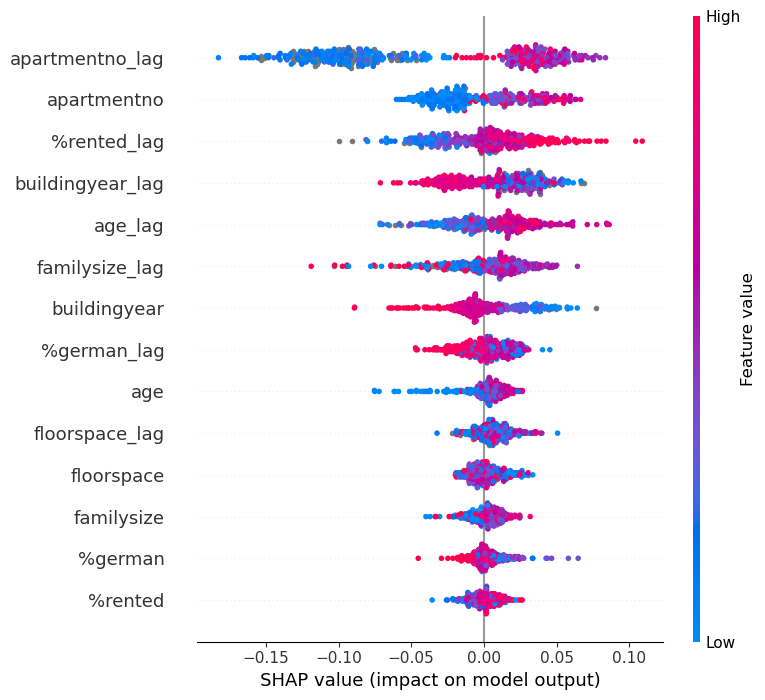

SHAP summary plot for class: 5.0


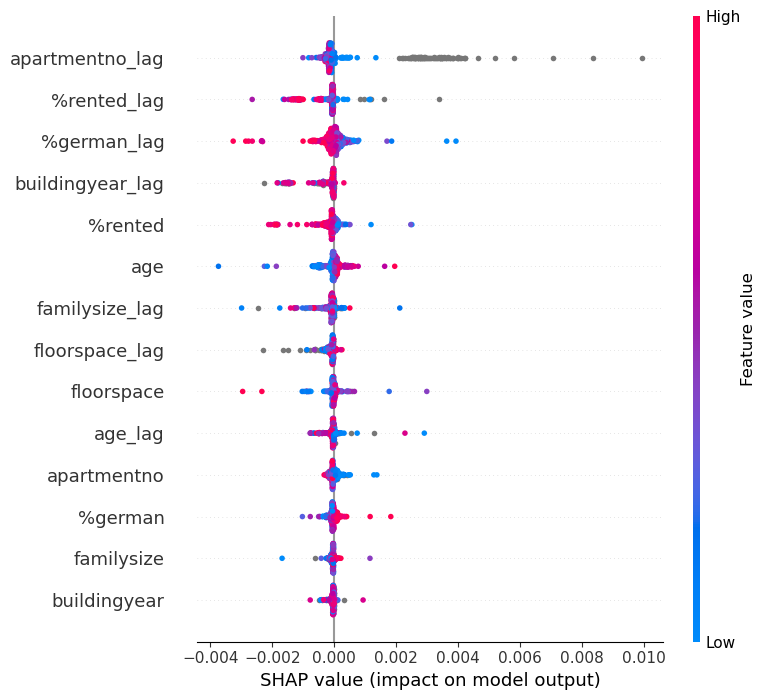

SHAP summary plot for class: 6.0


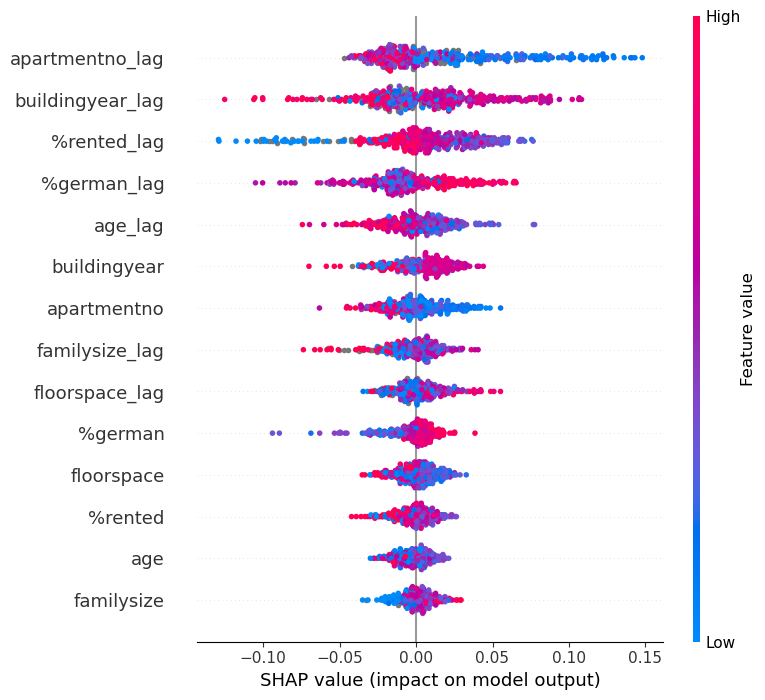

In [122]:
for i, class_name in enumerate(rf_spatial_cv.classes_):
    print(f"SHAP summary plot for class: {class_name}")
    shap.summary_plot(shap_values[:,:,i], X_test, feature_names=independent_variables)


In [120]:
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of shap_values: {np.array(shap_values).shape}")

Shape of X_test: (396, 14)
Shape of shap_values: (396, 14, 7)


In [ ]:
# with lag

In [68]:
pred = rf_spatial_cv.predict(X_test)

accuracy_spatial_cv = metrics.accuracy_score(pred, y_test)
kappa_spatial_cv = metrics.cohen_kappa_score(pred, y_test)

summary += f"""\
Basic model with spatial cross-validation:
  Accuracy: {round(accuracy_spatial_cv, 3)}
  Kappa:    {round(kappa_spatial_cv, 3)}
"""

print(summary)

Evaluation metrics
Basic model:
  Accuracy: 0.432
  Kappa:    0.364
Basic model with spatial cross-validation:
  Accuracy: 0.319
  Kappa:    0.24



In [69]:
pd.Series(model.feature_importances_, index=model.feature_names_in_).sort_values()

familysize          0.052381
%german             0.053775
%rented             0.055094
age                 0.057134
floorspace          0.063505
apartmentno         0.067067
familysize_lag      0.072597
floorspace_lag      0.074299
buildingyear        0.074330
%german_lag         0.074721
%rented_lag         0.081275
age_lag             0.085001
apartmentno_lag     0.088150
buildingyear_lag    0.100671
dtype: float64

In [132]:
# sample size 2000

In [131]:
pred = rf_spatial_cv.predict(X_test)

accuracy_spatial_cv = metrics.accuracy_score(pred, y_test)
kappa_spatial_cv = metrics.cohen_kappa_score(pred, y_test)

summary += f"""\
Basic model with spatial cross-validation:
  Accuracy: {round(accuracy_spatial_cv, 3)}
  Kappa:    {round(kappa_spatial_cv, 3)}
"""

print(summary)

Evaluation metrics
Basic model:
  Accuracy: 0.238
  Kappa:    0.161
Basic model with spatial cross-validation:
  Accuracy: 0.173
  Kappa:    0.087



In [129]:
pd.Series(model.feature_importances_, index=model.feature_names_in_).sort_values()

%holidayapt     0.008917
familysize      0.128089
buildingyear    0.136710
%rented         0.138590
apartmentno     0.138603
%german         0.139086
floorspace      0.154630
age             0.155374
dtype: float64

In [130]:
pd.Series(rf_spatial_cv.feature_importances_, index=rf_spatial_cv.feature_names_in_).sort_values()

%holidayapt     0.009093
familysize      0.124378
buildingyear    0.136493
%rented         0.138326
%german         0.139542
apartmentno     0.139877
age             0.154632
floorspace      0.157660
dtype: float64

In [101]:
# sample size 1500

In [102]:
pred = rf_spatial_cv.predict(X_test)

accuracy_spatial_cv = metrics.accuracy_score(pred, y_test)
kappa_spatial_cv = metrics.cohen_kappa_score(pred, y_test)

summary += f"""\
Basic model with spatial cross-validation:
  Accuracy: {round(accuracy_spatial_cv, 3)}
  Kappa:    {round(kappa_spatial_cv, 3)}
"""

print(summary)

Evaluation metrics
Basic model:
  Accuracy: 0.227
  Kappa:    0.153
Basic model with spatial cross-validation:
  Accuracy: 0.133
  Kappa:    0.046



In [104]:
pd.Series(model.feature_importances_, index=model.feature_names_in_).sort_values()

%holidayapt     0.009721
familysize      0.124305
buildingyear    0.133802
%german         0.134521
%rented         0.139734
apartmentno     0.145653
age             0.151721
floorspace      0.160543
dtype: float64

In [103]:
pd.Series(rf_spatial_cv.feature_importances_, index=rf_spatial_cv.feature_names_in_).sort_values()

%holidayapt     0.008618
familysize      0.125710
%german         0.136898
apartmentno     0.138058
%rented         0.138325
buildingyear    0.141449
age             0.154131
floorspace      0.156811
dtype: float64

In [29]:
# sample size 1000

In [78]:
pred = rf_spatial_cv.predict(X_test)

accuracy_spatial_cv = metrics.accuracy_score(pred, y_test)
kappa_spatial_cv = metrics.cohen_kappa_score(pred, y_test)

summary += f"""\
Basic model with spatial cross-validation:
  Accuracy: {round(accuracy_spatial_cv, 3)}
  Kappa:    {round(kappa_spatial_cv, 3)}
"""

print(summary)

Evaluation metrics
Basic model:
  Accuracy: 0.228
  Kappa:    0.152
Basic model with spatial cross-validation:
  Accuracy: 0.179
  Kappa:    0.093



In [79]:
pd.Series(model.feature_importances_, index=model.feature_names_in_).sort_values()

%holidayapt     0.006531
familysize      0.125645
buildingyear    0.135864
%german         0.139320
apartmentno     0.139551
%rented         0.142702
age             0.149791
floorspace      0.160596
dtype: float64

In [80]:
pd.Series(rf_spatial_cv.feature_importances_, index=rf_spatial_cv.feature_names_in_).sort_values()

%holidayapt     0.006175
familysize      0.125951
apartmentno     0.135212
%german         0.137414
buildingyear    0.139595
%rented         0.143610
floorspace      0.155992
age             0.156051
dtype: float64

In [ ]:
# sample size 500